In [26]:
%pip install pillow
%pip install numpy
%pip install scipy
%pip install opencv-python

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [27]:
from PIL import Image
import numpy as np
import math
from scipy import signal
import cv2
# from IPython.display import Image

In [28]:
def boxfilter(n): 
  assert n % 2 == 1
  return np.full((n, n), 1/n/n)
print(boxfilter(3))
# print(boxfilter(4))
print(boxfilter(5))

[[0.11111111 0.11111111 0.11111111]
 [0.11111111 0.11111111 0.11111111]
 [0.11111111 0.11111111 0.11111111]]
[[0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]]


In [29]:
def gauss1d(sigma): 
  n = round(sigma*6) if round(sigma*6) % 2 == 1 else round(sigma*6) + 1
  a = np.arange(-n//2 + 1, n//2 + 1)
  # print(a)
  a = np.exp(- a**2 / (2*sigma**2))
  # print(a)
  a = a/a.sum()
  # print(a)
  # print(a.sum())
  # print('next')
  return a
print(gauss1d(0.3))
print(gauss1d(0.5))
print(gauss1d(1))
print(gauss1d(2))

[0.00383626 0.99232748 0.00383626]
[0.10650698 0.78698604 0.10650698]
[0.00443305 0.05400558 0.24203623 0.39905028 0.24203623 0.05400558
 0.00443305]
[0.0022182  0.00877313 0.02702316 0.06482519 0.12110939 0.17621312
 0.19967563 0.17621312 0.12110939 0.06482519 0.02702316 0.00877313
 0.0022182 ]


In [30]:
def gauss2d(sigma): 
  a = gauss1d(sigma)[np.newaxis]
  # print(a)
  at = np.transpose(a)
  # print(at)
  a = signal.convolve2d(a, at)
  return a
print(np.array2string(gauss2d(0.5)))
print(np.array2string(gauss2d(1)))

[[0.01134374 0.08381951 0.01134374]
 [0.08381951 0.61934703 0.08381951]
 [0.01134374 0.08381951 0.01134374]]
[[1.96519161e-05 2.39409349e-04 1.07295826e-03 1.76900911e-03
  1.07295826e-03 2.39409349e-04 1.96519161e-05]
 [2.39409349e-04 2.91660295e-03 1.30713076e-02 2.15509428e-02
  1.30713076e-02 2.91660295e-03 2.39409349e-04]
 [1.07295826e-03 1.30713076e-02 5.85815363e-02 9.65846250e-02
  5.85815363e-02 1.30713076e-02 1.07295826e-03]
 [1.76900911e-03 2.15509428e-02 9.65846250e-02 1.59241126e-01
  9.65846250e-02 2.15509428e-02 1.76900911e-03]
 [1.07295826e-03 1.30713076e-02 5.85815363e-02 9.65846250e-02
  5.85815363e-02 1.30713076e-02 1.07295826e-03]
 [2.39409349e-04 2.91660295e-03 1.30713076e-02 2.15509428e-02
  1.30713076e-02 2.91660295e-03 2.39409349e-04]
 [1.96519161e-05 2.39409349e-04 1.07295826e-03 1.76900911e-03
  1.07295826e-03 2.39409349e-04 1.96519161e-05]]


In [31]:
# replace with manual
def convolve2d_manual(array, filter): 
  output = np.zeros_like(array)
  (k, k) = filter.shape
  # print(k)
  zero_pad_amount = k // 2
  # print(array)
  array = np.pad(array, zero_pad_amount, mode='constant')
  # print(array)
  padded_image = Image.fromarray(array.astype('uint8'))
  # display(padded_image)
  # This method returns an image of the same size as the input image, 
  # output can be adjusted and offset to return an image wit hthe padding needed for the filter
  for i in range(len(array)): 
    for j in range(len(array[0])): 
      submatrix = array[i:i+k, j:j+k]
      if (submatrix.shape == filter.shape): 
        output[i, j] = np.sum(np.multiply(submatrix, filter))
  return output
  # return signal.convolve2d(array, filter)

def gaussconvolve2d_manual(array, sigma): 
  filter = gauss2d(sigma)
  return convolve2d_manual(array, filter)




In [32]:
# from google.colab import files
# uploaded = files.upload()

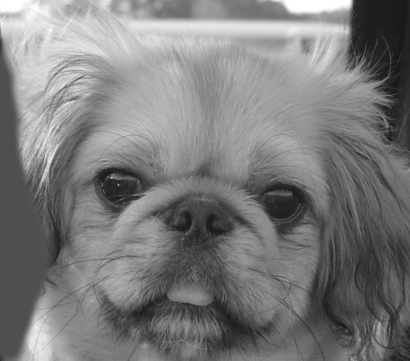

Duration manual:  2.4524013996124268
(361, 410)


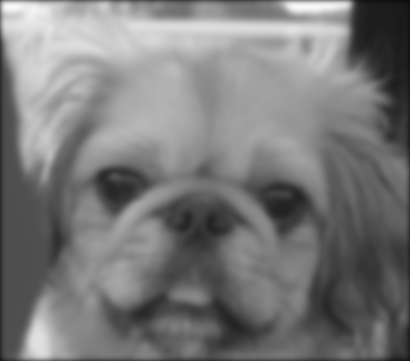

In [33]:
img_as_image = Image.open('0b_dog.bmp')
img_as_image = img_as_image.convert('L')
display(img_as_image)
img = np.asarray(img_as_image)
# print(img)
import time
t1 = time.time()
img_gaus = gaussconvolve2d_manual(img, 3)
print('Duration manual: ', time.time() - t1)
# print(img_gaus)
print(img_gaus.shape)
img_gaus = Image.fromarray(img_gaus.astype('uint8'))
display(img_gaus)

In [74]:
def gaussconvolve2d_scipy(array, sigma): 
    filter = gauss2d(sigma)
    # print(filter.shape)
    # print(array.shape)
    return signal.convolve2d(array, filter, 'same')
    return signal.correlate2d(array, filter, 'same')
    # the reason that these two are the same is because the filter is 180 degrees symmetric, which means convolution and correlation are the same

Duration scipy:  0.2622487545013428


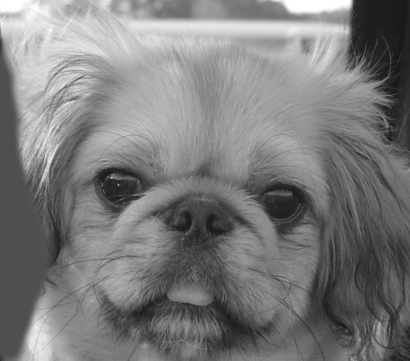

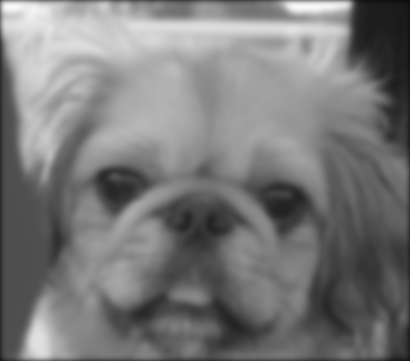

In [75]:
import time
t2 = time.time()
img_convolve_scipy = gaussconvolve2d_scipy(img, 3)
print('Duration scipy: ', time.time() - t2)
display(img_as_image)
img_convolve_scipy_image = Image.fromarray(img_convolve_scipy.astype('uint8'))
display(img_convolve_scipy_image)

In [36]:
import time
t3 = time.time()
_ = gaussconvolve2d_manual(img, 10)
print('Duration manual: ', time.time() - t3)
t4 = time.time()
_ = gaussconvolve2d_scipy(img, 10)
print('Duration scipy: ', time.time() - t4)
# My implementation should take around O(n^2) time, for n by n image and a comparatively small filter. 
# Difficult to say how long scipy's implementation takes, but it seems faster for smaller values of sigma
# With sigma of 10, it takes longer than the sigma of 3 from above, as n has increased and this is not done in constant time. 

Duration manual:  4.416004180908203
Duration scipy:  3.550987482070923


In [37]:
# Since the gaussian kernel is seperable, it can be convolved with the image twice, once in the x direction and once in the y direction.
# With sufficiently large sigma, on an image that is n by n, and a kernel that is m by m, this can reduce the runtime from O(n^2*m^2) to O(n^2*2m)


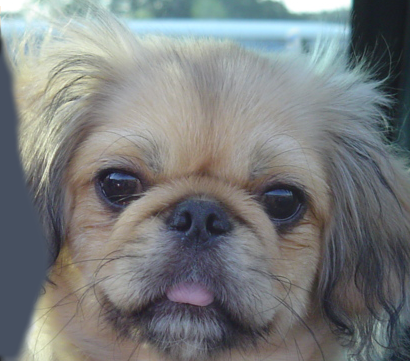

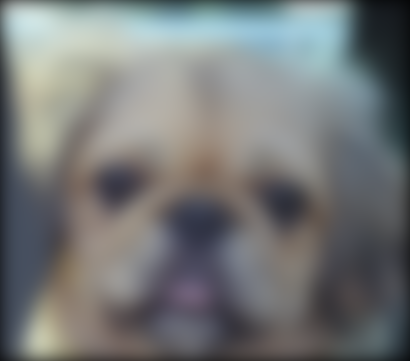

In [38]:
img_3_channels_as_image = Image.open('0b_dog.bmp').convert('RGB')
img_3_channels = np.array(img_3_channels_as_image, dtype='float')
# print(img_3_channels[:,:,0].shape)
output_3_channels = np.zeros_like(img_3_channels)
output_3_channels[:,:,0] = gaussconvolve2d_manual(img_3_channels[:,:,0], 10)
output_3_channels[:,:,1] = gaussconvolve2d_manual(img_3_channels[:,:,1], 10)
output_3_channels[:,:,2] = gaussconvolve2d_manual(img_3_channels[:,:,2], 10)
output_3_channels_as_image = Image.fromarray(output_3_channels.astype('uint8'))
display(img_3_channels_as_image)
display(output_3_channels_as_image)


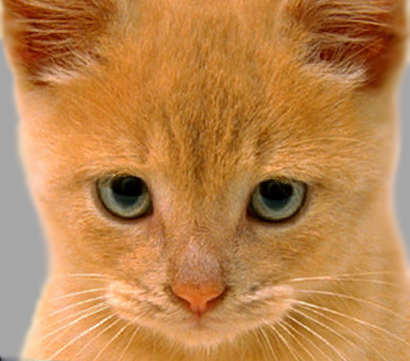

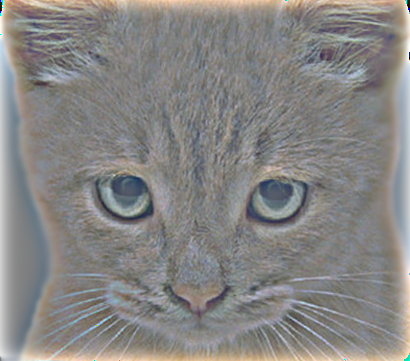

In [39]:
cat_3_channels_as_image = Image.open('0a_cat.bmp').convert('RGB')
cat_3_channels = np.array(cat_3_channels_as_image, dtype='float')
# print(img_3_channels[:,:,0].shape)
output_3_channels_cat = np.zeros_like(cat_3_channels)
output_3_channels_cat[:,:,0] = gaussconvolve2d_manual(cat_3_channels[:,:,0], 10)
output_3_channels_cat[:,:,1] = gaussconvolve2d_manual(cat_3_channels[:,:,1], 10)
output_3_channels_cat[:,:,2] = gaussconvolve2d_manual(cat_3_channels[:,:,2], 10)
subtracted = cat_3_channels - output_3_channels_cat
subtracted_visualize = subtracted + 128
subtracted_visualize_as_image = Image.fromarray(subtracted_visualize.astype('uint8'))
display(cat_3_channels_as_image)
display(subtracted_visualize_as_image)

169.8809635533144
229.0577472964937


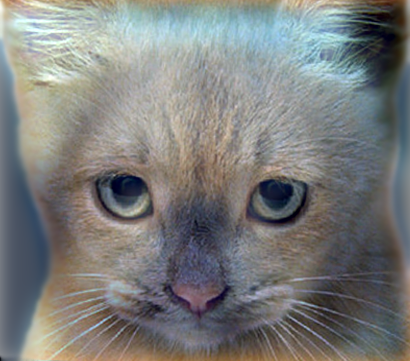

In [40]:
sum_of_both = subtracted + output_3_channels
print(subtracted.max())
print(output_3_channels.max())
# sum_of_both //= 2
sum_of_both = np.clip(sum_of_both, 0, 255)
# print(sum_of_both.max())
# sum_of_both = cv2.add(subtracted, output_3_channels)
sum_of_both_as_image = Image.fromarray(sum_of_both.astype('uint8'))
display(sum_of_both_as_image)

In [58]:
def create_hybrid(high_src, low_src): 
    # low pass filter
    low_3_ch_img = Image.open(low_src).convert('RGB')
    low_3_ch = np.array(low_3_ch_img, dtype='float')
    low_3_ch_filtered = np.zeros_like(low_3_ch)
    low_3_ch_filtered = np.dstack([gaussconvolve2d_manual(low_3_ch[:,:,i], 10) for i in range(3)])
    low_3_ch_filtered_img = Image.fromarray(low_3_ch_filtered.astype('uint8'))
    display(low_3_ch_img)
    display(low_3_ch_filtered_img)
    # high pass filter
    high_3_ch_img = Image.open(high_src).convert('RGB')
    high_3_ch = np.array(high_3_ch_img, dtype='float')
    subtrahend_3_ch = np.zeros_like(high_3_ch)
    subtrahend_3_ch = np.dstack([gaussconvolve2d_manual(high_3_ch[:,:,i], 10) for i in range(3)])
    high_3_ch_filtered = high_3_ch - subtrahend_3_ch
    high_3_ch_filtered_visual = high_3_ch_filtered + 128
    high_3_ch_filtered_visual_img = Image.fromarray(high_3_ch_filtered_visual.astype('uint8'))
    display(high_3_ch_img)
    display(high_3_ch_filtered_visual_img)
    # sum of both
    sum_3_ch = low_3_ch_filtered + high_3_ch_filtered
    sum_3_ch_clipped = np.clip(sum_3_ch, 0, 255)
    sum_3_ch_clipped_img = Image.fromarray(sum_3_ch_clipped.astype('uint8'))
    display(sum_3_ch_clipped_img)

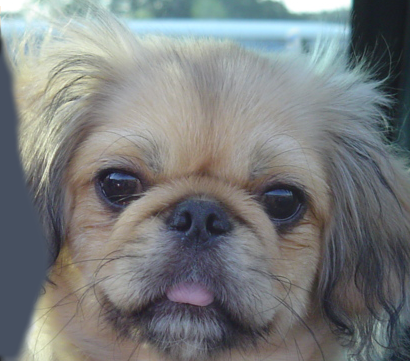

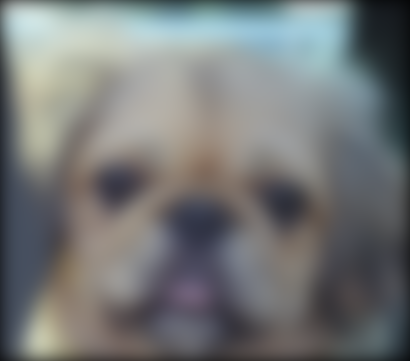

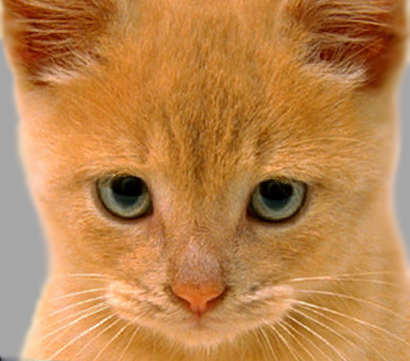

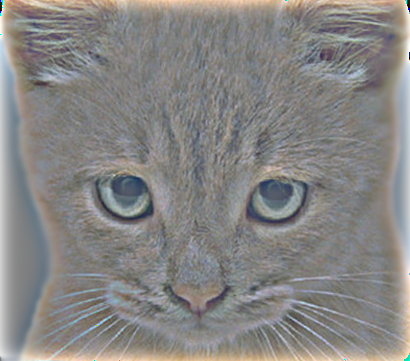

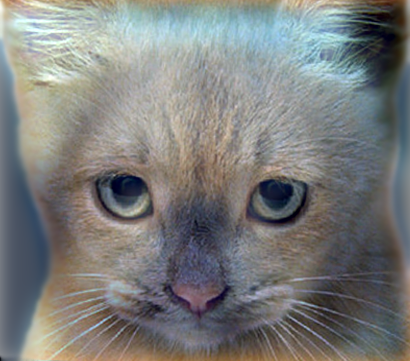

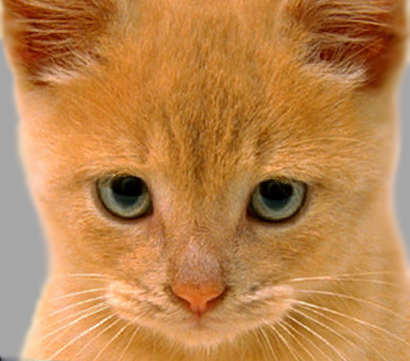

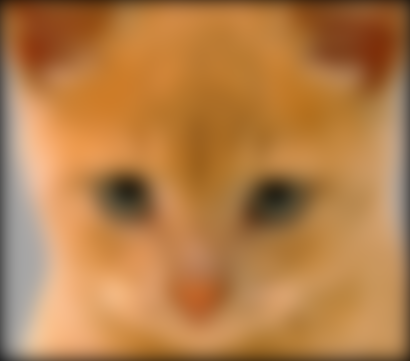

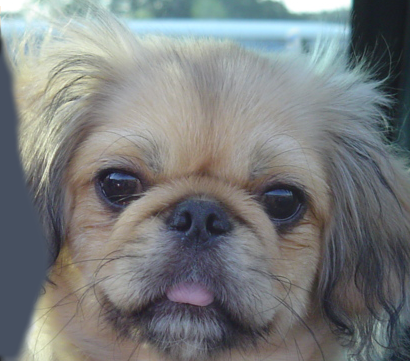

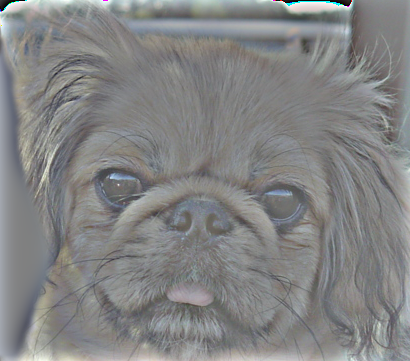

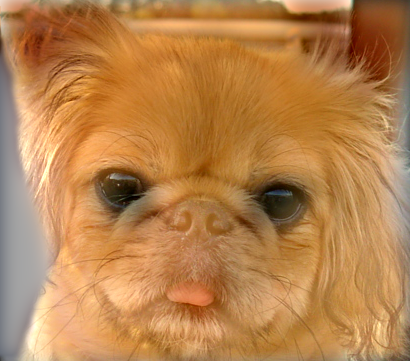

In [59]:
create_hybrid('0a_cat.bmp', '0b_dog.bmp')
create_hybrid('0b_dog.bmp', '0a_cat.bmp')

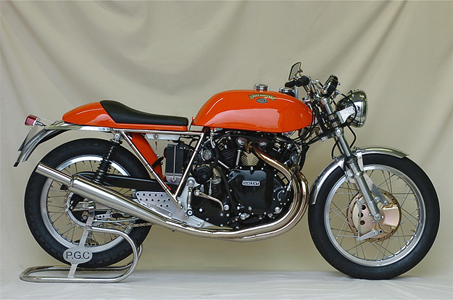

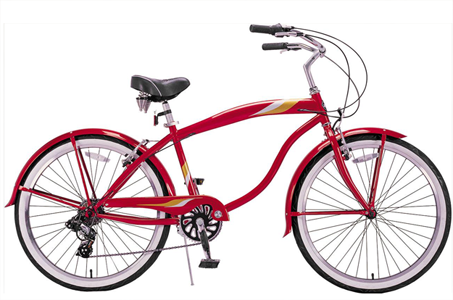

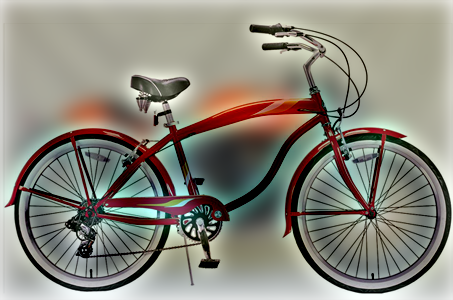

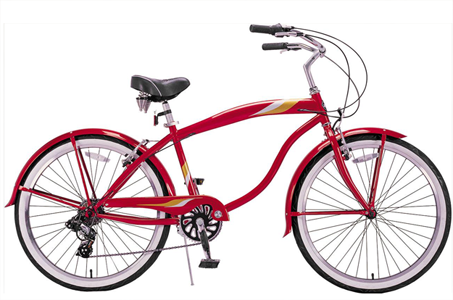

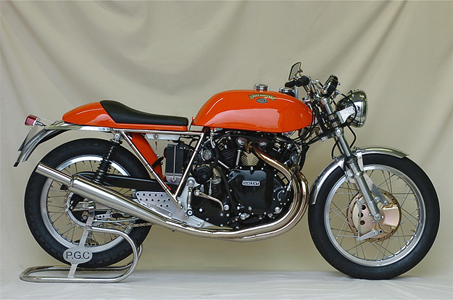

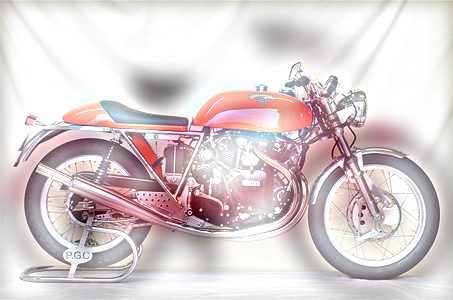

In [43]:
create_hybrid('1a_bicycle.bmp', '1b_motorcycle.bmp')
create_hybrid('1b_motorcycle.bmp', '1a_bicycle.bmp')

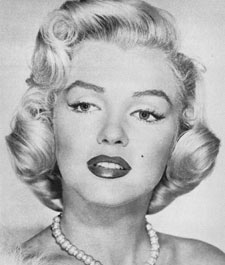

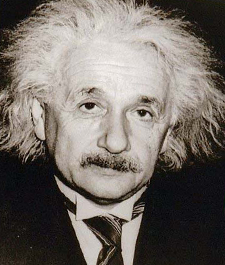

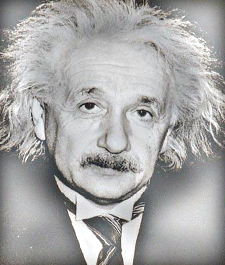

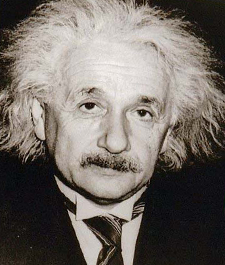

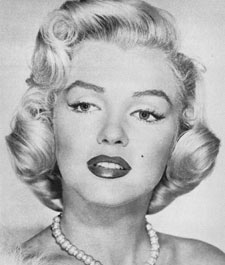

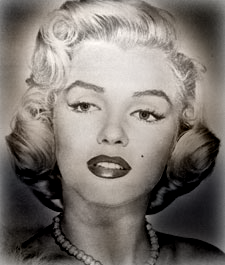

In [44]:
create_hybrid('2a_einstein.bmp', '2b_marilyn.bmp')
create_hybrid('2b_marilyn.bmp', '2a_einstein.bmp')

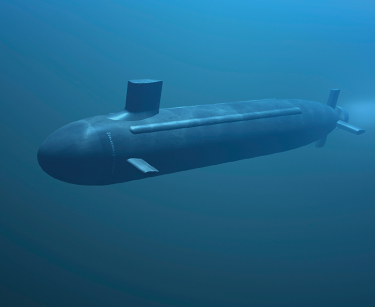

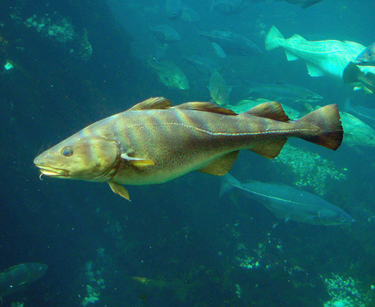

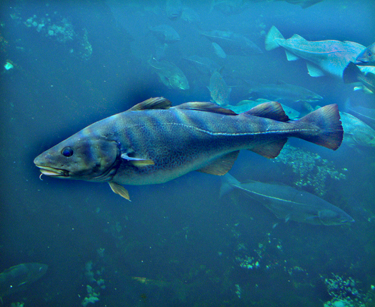

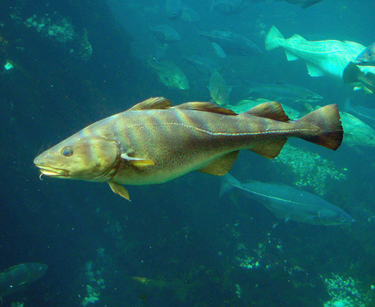

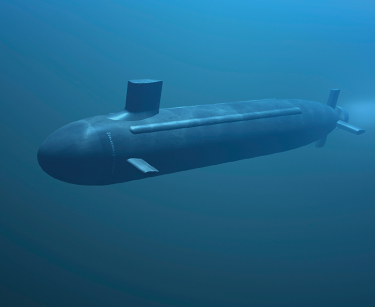

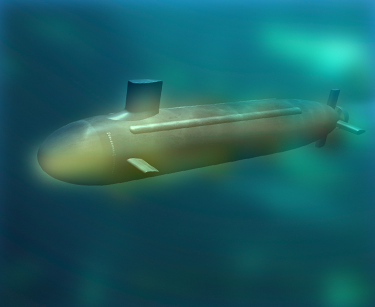

In [45]:
create_hybrid('3a_fish.bmp', '3b_submarine.bmp')
create_hybrid('3b_submarine.bmp', '3a_fish.bmp')

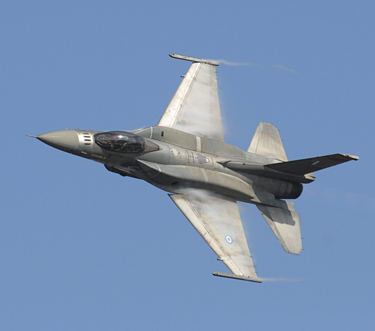

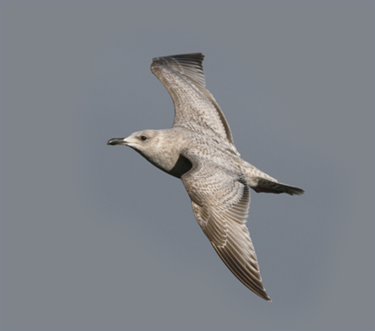

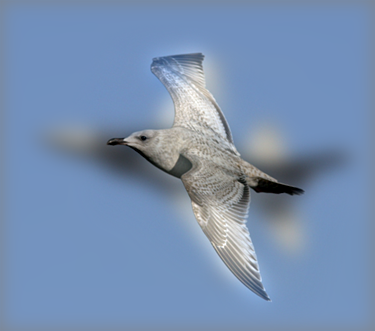

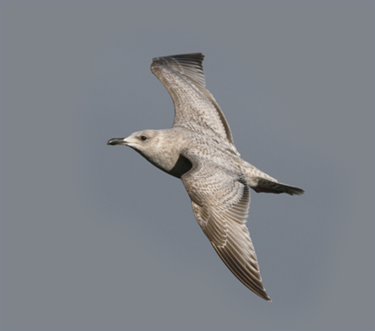

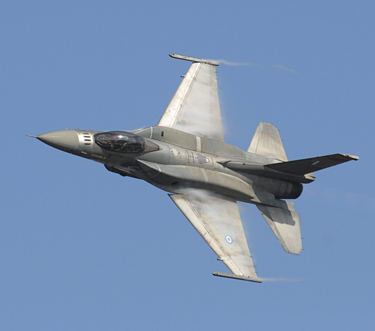

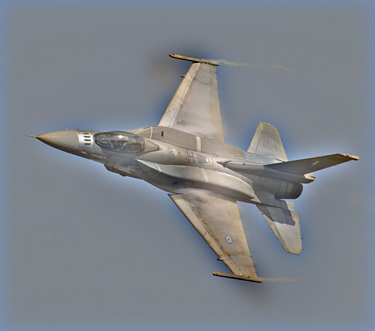

In [46]:
create_hybrid('4a_bird.bmp', '4b_plane.bmp')
create_hybrid('4b_plane.bmp', '4a_bird.bmp')

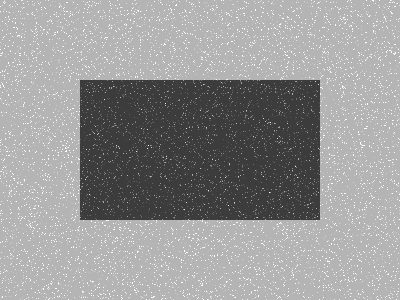

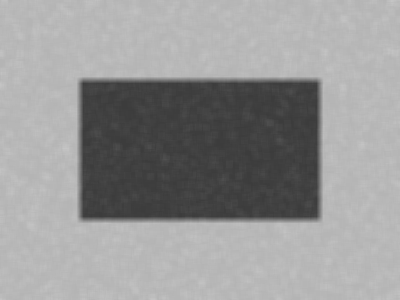

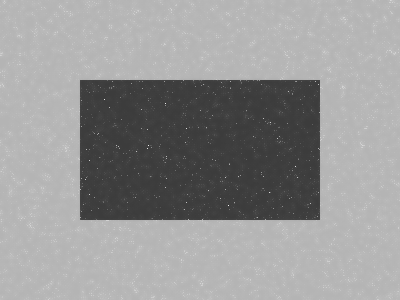

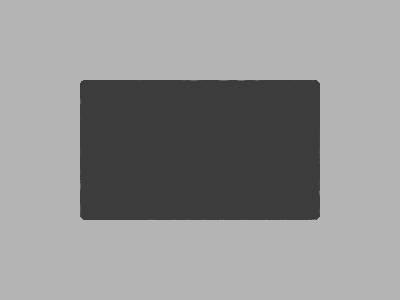

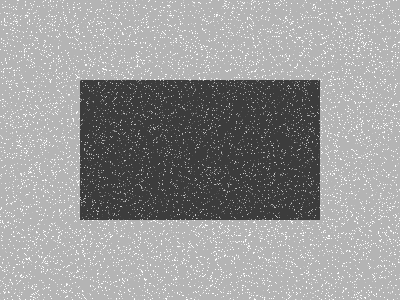

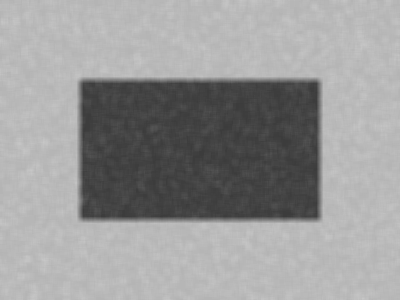

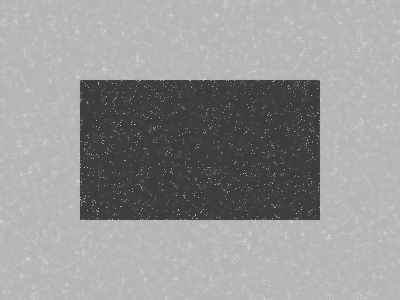

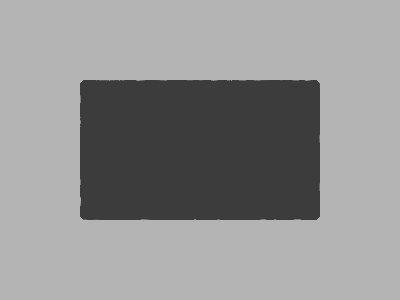

In [47]:
box_gauss = cv2.imread('box_gauss.png')
display(Image.fromarray(box_gauss))

# Gaussian blur has trouble removing the noise, as the difference in brightness between the noise and its background is too large, 
# it also fuzzes the edges of the rectangle. 
display(Image.fromarray(cv2.GaussianBlur(box_gauss, (7, 7), 50).astype('uint8')))

# Bilateral filter has troulbe removing the noise, as the difference in brightness between the noise and its background is too large,
# it is able to retain the clear edges of the rectangle
display(Image.fromarray(cv2.bilateralFilter(box_gauss, 7, 150, 150).astype('uint8')))

# Median blur is able to remove the noise, 
# it is able to retain the straight edges of the rectangle, but has trouble with the corners as it rounds them off, which makes sense as kernel centered on the corner would be around 1/4 of the rectangle, and 3/4 the background
display(Image.fromarray(cv2.medianBlur(box_gauss, 7).astype('uint8')))

box_speckle = cv2.imread('box_speckle.png')
display(Image.fromarray(box_speckle))

# Gaussian blur has trouble removing the noise, as the difference in brightness between the noise and its background is too large, 
# it also fuzzes the edges of the rectangle. 
display(Image.fromarray(cv2.GaussianBlur(box_speckle, (7, 7), 50).astype('uint8')))

# Bilateral filter has troulbe removing the noise, as the difference in brightness between the noise and its background is too large,
# it is able to retain the clear edges of the rectangle
display(Image.fromarray(cv2.bilateralFilter(box_speckle, 7, 150, 150).astype('uint8')))

# Median blur is able to remove the noise, 
# it has heavy artifacting on the straight edges of the rectangle, as it has trouble distinguishing between noise, foreground and background brightnesses
display(Image.fromarray(cv2.medianBlur(box_speckle, 7).astype('uint8')))

In [60]:
# TESTING NOT APART OF ASSIGNMENT
def create_hybrid_without_float(high_src, low_src): 
    # low pass filter
    low_3_ch_img = Image.open(low_src).convert('RGB')
    low_3_ch = np.array(low_3_ch_img, dtype='uint8')
    low_3_ch_filtered = np.zeros_like(low_3_ch)
    low_3_ch_filtered[:,:,0] = gaussconvolve2d_manual(low_3_ch[:,:,0], 10)
    low_3_ch_filtered[:,:,1] = gaussconvolve2d_manual(low_3_ch[:,:,1], 10)
    low_3_ch_filtered[:,:,2] = gaussconvolve2d_manual(low_3_ch[:,:,2], 10)
    low_3_ch_filtered_img = Image.fromarray(low_3_ch_filtered.astype('uint8'))
    display(low_3_ch_img)
    # display(low_3_ch_filtered_img)
    # high pass filter
    high_3_ch_img = Image.open(high_src).convert('RGB')
    high_3_ch = np.array(high_3_ch_img, dtype='uint8')
    subtrahend_3_ch = np.zeros_like(high_3_ch)
    subtrahend_3_ch[:,:,0] = gaussconvolve2d_manual(high_3_ch[:,:,0], 10)
    subtrahend_3_ch[:,:,1] = gaussconvolve2d_manual(high_3_ch[:,:,1], 10)
    subtrahend_3_ch[:,:,2] = gaussconvolve2d_manual(high_3_ch[:,:,2], 10)
    high_3_ch_filtered = high_3_ch - subtrahend_3_ch
    high_3_ch_filtered_visual = high_3_ch_filtered + 128
    high_3_ch_filtered_visual_img = Image.fromarray(high_3_ch_filtered_visual.astype('uint8'))
    display(high_3_ch_img)
    # display(high_3_ch_filtered_visual_img)
    # sum of both
    sum_3_ch = low_3_ch_filtered + high_3_ch_filtered
    sum_3_ch_clipped = np.clip(sum_3_ch, 0, 255)
    sum_3_ch_clipped_img = Image.fromarray(sum_3_ch_clipped.astype('uint8'))
    display(sum_3_ch_clipped_img)


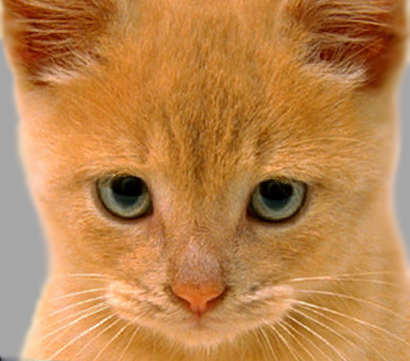

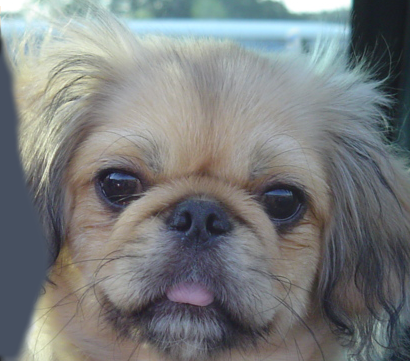

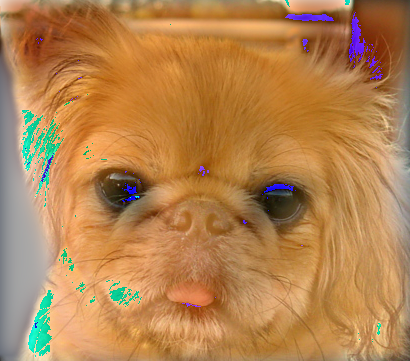

In [76]:
create_hybrid_without_float('0b_dog.bmp', '0a_cat.bmp')